First of all, downloading the data

In [ ]:
!git clone https://github.com/rslim087a/track

Cloning into 'track'...
remote: Enumerating objects: 12163, done.
remote: Total 12163 (delta 0), reused 0 (delta 0), pack-reused 12163
Receiving objects: 100% (12163/12163), 156.98 MiB | 35.59 MiB/s, done.
Updating files: 100% (12160/12160), done.


In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tensorflow import keras
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense, Conv2D
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa
import cv2
import ntpath
import random

In [ ]:
datadir = 'track'
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
data = pd.read_csv(os.path.join(datadir, 'driving_log.csv'), names=columns)
pd.set_option('display.max_colwidth', -1) # To see the entire path of the image
data.head(10)

<ipython-input-3-02581ba72ba0>:4: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1) # To see the entire path of the image


,center,left,right,steering,throttle,reverse,speed
0,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_382.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_382.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_382.jpg,0.0,0.000000,0.0,0.649786
1,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_670.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_670.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_670.jpg,0.0,0.000000,0.0,0.627942
2,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_724.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_724.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_724.jpg,0.0,0.000000,0.0,0.622910
3,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_792.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_792.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_792.jpg,0.0,0.000000,0.0,0.619162
4,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_860.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_860.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_860.jpg,0.0,0.000000,0.0,0.615438
5,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_930.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_930.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_930.jpg,0.0,0.000000,0.0,0.610506
6,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_998.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_998.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_998.jpg,0.0,0.000000,0.0,0.606834
7,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_44_069.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_44_069.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_44_069.jpg,0.0,0.000000,0.0,0.601971
8,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_44_137.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_44_137.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_44_137.jpg,0.0,0.000000,0.0,0.598350
9,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_44_209.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_44_209.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_44_209.jpg,0.0,0.024006,0.0,0.620654


In [ ]:
def path_leaf(path):
  head, tail = ntpath.split(path)
  return tail

data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)
data.head(10)

,center,left,right,steering,throttle,reverse,speed
0,center_2018_07_16_17_11_43_382.jpg,left_2018_07_16_17_11_43_382.jpg,right_2018_07_16_17_11_43_382.jpg,0.0,0.000000,0.0,0.649786
1,center_2018_07_16_17_11_43_670.jpg,left_2018_07_16_17_11_43_670.jpg,right_2018_07_16_17_11_43_670.jpg,0.0,0.000000,0.0,0.627942
2,center_2018_07_16_17_11_43_724.jpg,left_2018_07_16_17_11_43_724.jpg,right_2018_07_16_17_11_43_724.jpg,0.0,0.000000,0.0,0.622910
3,center_2018_07_16_17_11_43_792.jpg,left_2018_07_16_17_11_43_792.jpg,right_2018_07_16_17_11_43_792.jpg,0.0,0.000000,0.0,0.619162
4,center_2018_07_16_17_11_43_860.jpg,left_2018_07_16_17_11_43_860.jpg,right_2018_07_16_17_11_43_860.jpg,0.0,0.000000,0.0,0.615438
5,center_2018_07_16_17_11_43_930.jpg,left_2018_07_16_17_11_43_930.jpg,right_2018_07_16_17_11_43_930.jpg,0.0,0.000000,0.0,0.610506
6,center_2018_07_16_17_11_43_998.jpg,left_2018_07_16_17_11_43_998.jpg,right_2018_07_16_17_11_43_998.jpg,0.0,0.000000,0.0,0.606834
7,center_2018_07_16_17_11_44_069.jpg,left_2018_07_16_17_11_44_069.jpg,right_2018_07_16_17_11_44_069.jpg,0.0,0.000000,0.0,0.601971
8,center_2018_07_16_17_11_44_137.jpg,left_2018_07_16_17_11_44_137.jpg,right_2018_07_16_17_11_44_137.jpg,0.0,0.000000,0.0,0.598350
9,center_2018_07_16_17_11_44_209.jpg,left_2018_07_16_17_11_44_209.jpg,right_2018_07_16_17_11_44_209.jpg,0.0,0.024006,0.0,0.620654


## Visualizing the steering angle w.r.t all the image positions

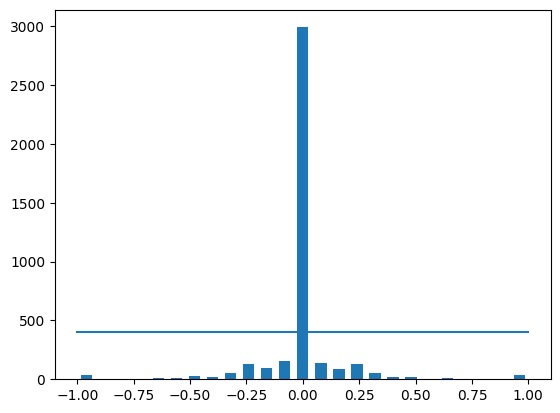

In [ ]:
num_bins = 25
samples_per_bin = 400
hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1] + bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [ ]:
print('Total Data: ', len(data))
print(data.shape)

Total Data:  4053
(4053, 7)


### Balancing the Data

In [ ]:
remove_list = []
for j in range(num_bins):
  list1 = []
  for i in range(len(data['steering'])):
    if (data['steering'][i] >= bins[j]) and (data['steering'][i] <= bins[j+1]):
      list1.append(i)
  list1 = shuffle(list1)
  list1 = list1[samples_per_bin:]
  remove_list.extend(list1)

print('Removed:', len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print('Remaining:', len(data))

Removed: 2590
Remaining: 1463


Plotting the Distribution

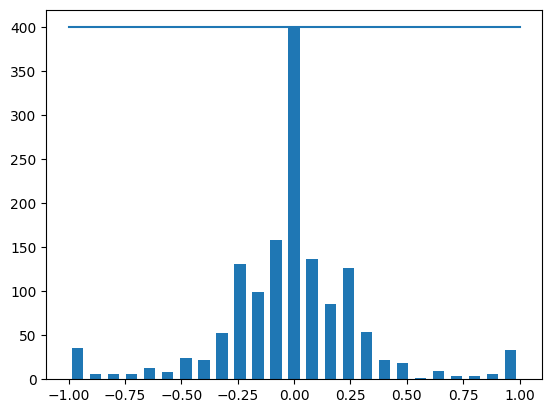

In [ ]:
hist, _ = np.histogram(data['steering'], (num_bins))
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

## Train Test Split

In [ ]:
def load_img_steering(datadir, df):
  image_path = []
  steering = []
  for i in range(len(data)):
    indexed_data = data.iloc[i]
    center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
    image_path.append(os.path.join(datadir, center.strip()))
    steering.append(float(indexed_data[3]))

    # Left image append
    image_path.append(os.path.join(datadir, left.strip()))
    steering.append(float(indexed_data[3])+0.15)

    # Right image append
    image_path.append(os.path.join(datadir, right.strip()))
    steering.append(float(indexed_data[3])-0.15)

  image_paths = np.asarray(image_path)
  steerings = np.asarray(steering)
  return image_paths, steerings

In [ ]:
image_paths, steerings = load_img_steering(datadir + '/IMG', data)

In [ ]:
image_paths

array(['track/IMG/center_2018_07_16_17_11_43_930.jpg',
       'track/IMG/left_2018_07_16_17_11_43_930.jpg',
       'track/IMG/right_2018_07_16_17_11_43_930.jpg', ...,
       'track/IMG/center_2018_07_16_17_16_32_161.jpg',
       'track/IMG/left_2018_07_16_17_16_32_161.jpg',
       'track/IMG/right_2018_07_16_17_16_32_161.jpg'], dtype='<U44')

In [ ]:
len(image_paths)

4389

In [ ]:
steerings

array([ 0.  ,  0.15, -0.15, ...,  0.  ,  0.15, -0.15])

In [ ]:
len(steerings)

4389

In [ ]:
X_train, X_valid, Y_train, Y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)

In [ ]:
print(f"Training Samples: {len(X_train)} \nValid Samples: {len(X_valid)}")

Training Samples: 3511 
Valid Samples: 878


Plotting the distribution of Training and Validation Dataset

Text(0.5, 1.0, 'Validation set')

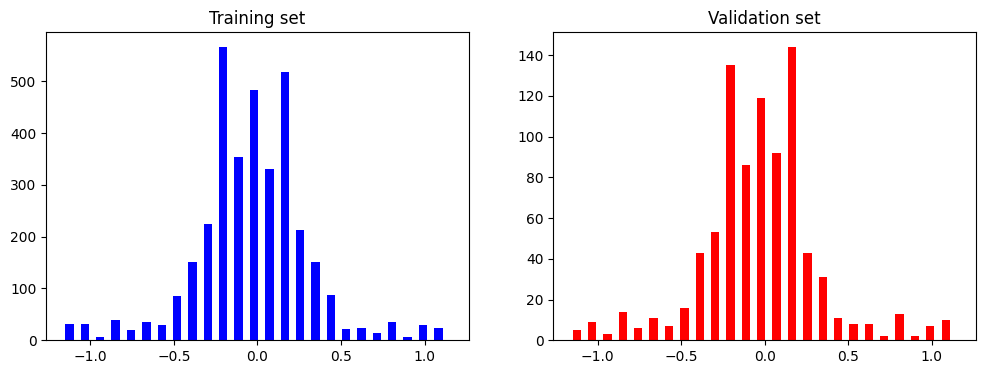

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# For Training Set
axes[0].hist(Y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')

# For Validation Set
axes[1].hist(Y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation set')

### Performing Data Augmentation

In [ ]:
def zoom(image):
  zoom = iaa.Affine(scale=(1, 1.3))
  image = zoom.augment_image(image)
  return image

In [ ]:
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)

Text(0.5, 1.0, 'Zoomed Image')

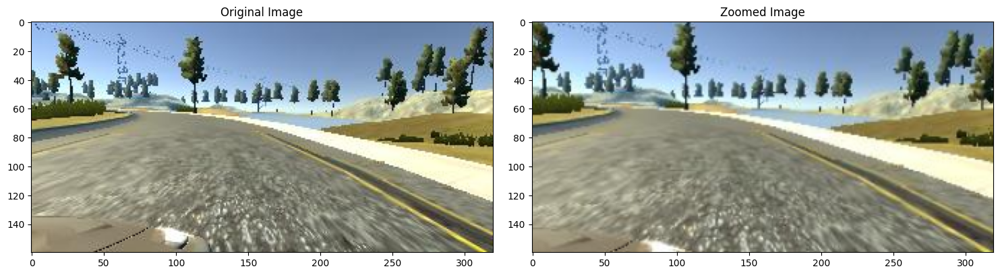

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

# For original image
axs[0].imshow(original_image)
axs[0].set_title('Original Image')

# For zoomed image
axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')

Another augmentation technique

In [ ]:
def pan(image):
  pan = iaa.Affine(translate_percent = {"x":(-0.1, 0.1), "y":(-0.1, 0.1)})
  image = pan.augment_image(image)
  return image

Text(0.5, 1.0, 'Panned Image')

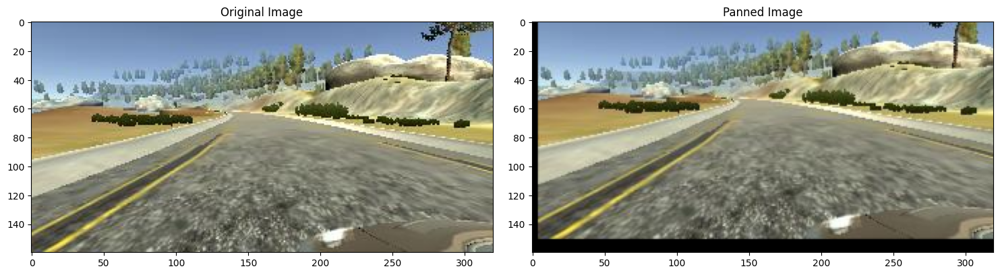

In [ ]:
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

# For original image
axs[0].imshow(original_image)
axs[0].set_title('Original Image')

# For panned image
axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

Random Brightness Technique

In [ ]:
def img_random_brightness(image):
  brightness = iaa.Multiply((0.2, 1.2))
  image = brightness.augment_image(image)
  return image

Text(0.5, 1.0, 'Brightness Altered Image')

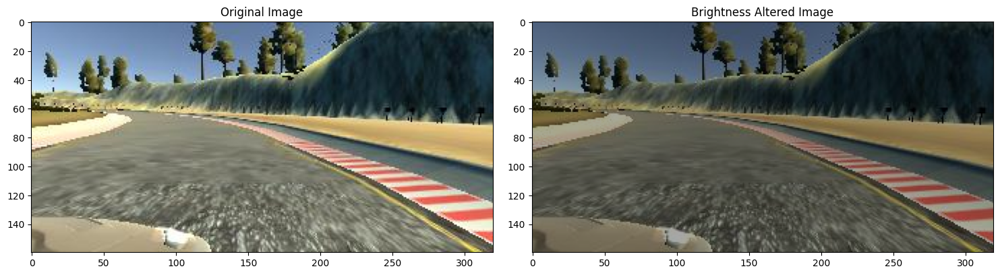

In [ ]:
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

# For original image
axs[0].imshow(original_image)
axs[0].set_title('Original Image')

# For Brightness Altered Image
axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness Altered Image')

Flipping Technique

In [ ]:
def img_random_flip(image, steering_angle):
  image = cv2.flip(image,1)
  steering_angle = -steering_angle
  return image, steering_angle

Text(0.5, 1.0, 'Flipped Image - Steering Angle:0.15')

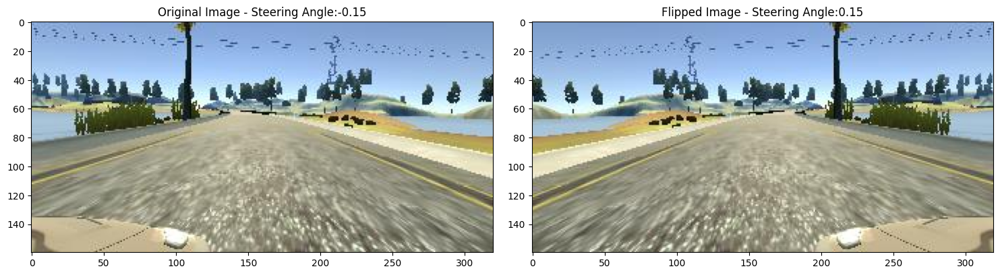

In [ ]:
random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]

original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

# For original image
axs[0].imshow(original_image)
axs[0].set_title('Original Image - ' + 'Steering Angle:' + str(steering_angle))

# For Flipped Image
axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - ' + 'Steering Angle:' + str(flipped_steering_angle))

One final Function to call the all the augmentation techniques

In [ ]:
def random_augment(image, steering_angle):
  image = mpimg.imread(image)
  if np.random.rand() < 0.5:
    image = pan(image)
  if np.random.rand() < 0.5:
    image = zoom(image)
  if np.random.rand() < 0.5:
    image = img_random_brightness(image)
  if np.random.rand() < 0.5:
    image, steering_angle = img_random_flip(image, steering_angle)

  return image, steering_angle

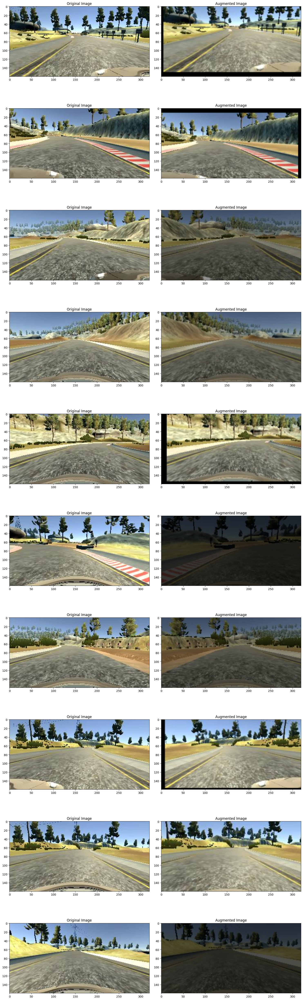

In [ ]:
num_of_col = 2
num_of_row = 10

fig, axs = plt.subplots(num_of_row, num_of_col, figsize=(15, 50))
fig.tight_layout()

for i in range(10):
  randnum = random.randint(0, len(image_paths) - 1)
  random_image = image_paths[randnum]
  random_steering = steerings[randnum]

  original_image = mpimg.imread(random_image)
  augmented_image, steering = random_augment(random_image, random_steering)

  # For original image
  axs[i][0].imshow(original_image)
  axs[i][0].set_title("Original Image")

  # For augmented image
  axs[i][1].imshow(augmented_image)
  axs[i][1].set_title("Augmented Image")

## Image Processing

In [ ]:
def img_preprocess(img):
  img = img[60:135,:,:]
  img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
  img = cv2.GaussianBlur(img,  (3, 3), 0)
  img = cv2.resize(img, (200, 66))
  img = img/255
  return img

Text(0.5, 1.0, 'Preprocessed Image')

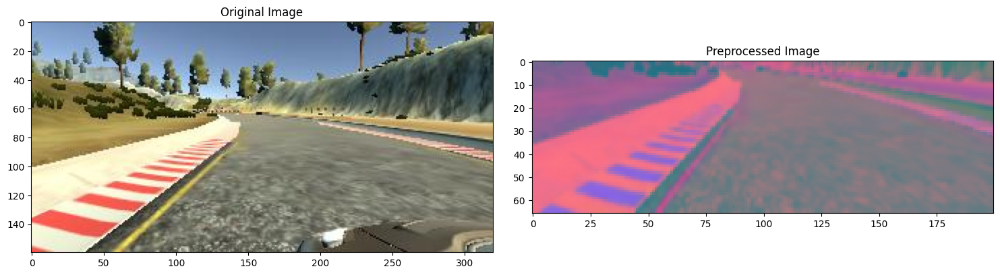

In [ ]:
image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

# For original image
axs[0].imshow(original_image)
axs[0].set_title('Original Image')

# For preprocessed image
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

## Batch Generator

In [ ]:
!nvidia-smi

Sun Nov 12 11:45:35 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   41C    P8     9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):

  while True:
    batch_img = []
    batch_steering = []

    for i in range(batch_size):
      random_index = random.randint(0, len(image_paths) - 1)

      if istraining:
        im, steering = random_augment(image_paths[random_index], steering_ang[random_index])

      else:
        im = mpimg.imread(image_paths[random_index])
        steering = steering_ang[random_index]

      im = img_preprocess(im)
      batch_img.append(im)
      batch_steering.append(steering)
    yield (np.asarray(batch_img), np.asarray(batch_steering))

In [ ]:
X_train_gen, Y_train_gen = next(batch_generator(X_train, Y_train, 1, 1))
X_valid_gen, Y_valid_gen = next(batch_generator(X_valid, Y_valid, 1, 0))

Text(0.5, 1.0, 'Validation Image')

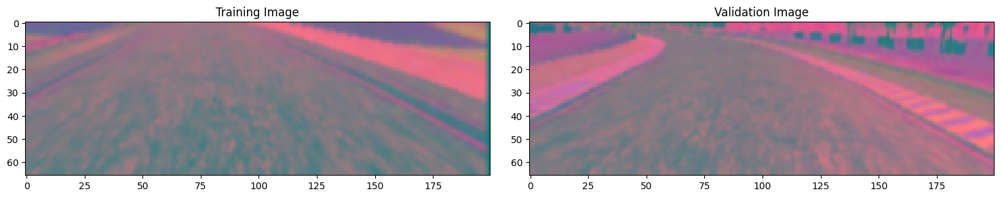

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

# For training image
axs[0].imshow(X_train_gen[0])
axs[0].set_title('Training Image')

# For validation image
axs[1].imshow(X_valid_gen[0])
axs[1].set_title('Validation Image')

## Nvidia Model

In [ ]:
def nvidia_model():
  model = Sequential()
  model.add(Conv2D(24, (5, 5), strides=(2, 2), input_shape=(66, 200, 3), activation='elu'))
  model.add(Conv2D(36, (5, 5), strides=(2, 2), activation='elu'))
  model.add(Conv2D(48, (5, 5), strides=(2, 2), activation='elu'))
  model.add(Conv2D(64, (5, 5), activation='elu'))
  # model.add(Conv2D(64, (3,3), activation='elu'))
  # model.add(Dropout(0.5))


  model.add(Flatten())

  model.add(Dense(100, activation = 'elu'))
  # model.add(Dropout(0.5))

  model.add(Dense(50, activation = 'elu'))
  # model.add(Dropout(0.5))

  model.add(Dense(10, activation = 'elu'))
  # model.add(Dropout(0.5))

  model.add(Dense(1))

  optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
  model.compile(loss='mse', optimizer=optimizer)
  return model

model = nvidia_model()
print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 31, 98, 24)        1824      
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 47, 36)        21636     
                                                                 
 conv2d_2 (Conv2D)           (None, 5, 22, 48)         43248     
                                                                 
 conv2d_3 (Conv2D)           (None, 1, 18, 64)         76864     
                                                                 
 flatten (Flatten)           (None, 1152)              0         
                                                                 
 dense (Dense)               (None, 100)               115300    
                                                                 
 dense_1 (Dense)             (None, 50)                5

## Training the Model

In [ ]:
history = model.fit_generator(batch_generator(X_train, Y_train, 100, 1),
                                  steps_per_epoch=300,
                                  epochs=10,
                                  validation_data=batch_generator(X_valid, Y_valid, 100, 0),
                                  validation_steps=200,
                                  verbose=1,
                                  shuffle = 1)

<ipython-input-47-ecf05c599cd8>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(batch_generator(X_train, Y_train, 100, 1),


Epoch 1/10
300/300 [==============================] - 149s 451ms/step - loss: 0.1327 - val_loss: 0.0657
Epoch 2/10
300/300 [==============================] - 133s 444ms/step - loss: 0.0723 - val_loss: 0.0555
Epoch 3/10
300/300 [==============================] - 117s 390ms/step - loss: 0.0628 - val_loss: 0.0459
Epoch 4/10
300/300 [==============================] - 117s 392ms/step - loss: 0.0560 - val_loss: 0.0413
Epoch 5/10
300/300 [==============================] - 126s 420ms/step - loss: 0.0510 - val_loss: 0.0354
Epoch 6/10
300/300 [==============================] - 162s 541ms/step - loss: 0.0463 - val_loss: 0.0422
Epoch 7/10
300/300 [==============================] - 153s 511ms/step - loss: 0.0451 - val_loss: 0.0342
Epoch 8/10
300/300 [==============================] - 106s 354ms/step - loss: 0.0418 - val_loss: 0.0298
Epoch 9/10
300/300 [==============================] - 111s 372ms/step - loss: 0.0416 - val_loss: 0.0302
Epoch 10/10
300/300 [==============================] - 139s 466m

Text(0.5, 0, 'Epoch')

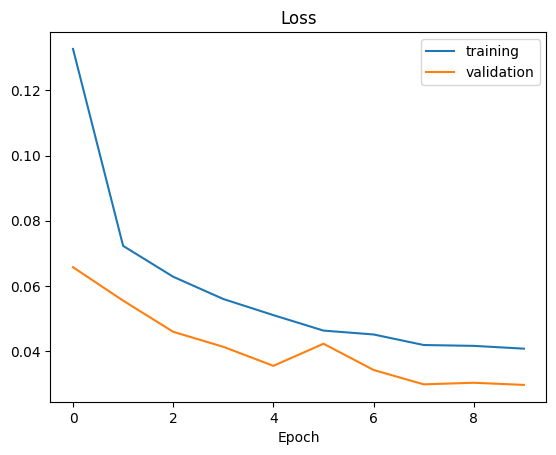

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')

In [ ]:
model.save('model.h5')
from google.colab import files
files.download('model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>